In [1]:
import scanpy
import anndata
import matplotlib
from matplotlib import pyplot
import hdf5plugin
import numpy
import scvelo
import seaborn
import pandas
import warnings
import cellrank
import gseapy
import IPython
import pygam

In [2]:
# Read input file

working_directory = "RNA Sequencing Data/"

# Use adata from velocity analysis
adata = scanpy.read_h5ad(working_directory + "/velocity_sdevelo.h5ad")

print(adata)

AnnData object with n_obs × n_vars = 12791 × 2000
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'latent_time', 'sde_velocity_self_transition', 'manual_root', 'manual_end', 'sde_velocity_pseudotime'
    var: 'ensemble_ids', 'gene_symbol', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_sigma_1', 'fit_sigma_2'
    uns: 'log1p', 'neighbors', 'pca', 'sample_colors', 'sde_velocity_graph', 'sde_velocity_graph_neg', 'sde_velocity_params'
    obsm: 'X_fdl', 'X_pca', 'X_umap', 'sde_velocity_fdl'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'pred_s', 'pred_u', 'sde_velocity', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'


In [3]:
reprogramming_group_indices = (adata.obs["group"] == "control") | (adata.obs["group"] == "Hic2")
control_indices = adata.obs["group"] == "control"
hic2_indices = adata.obs["group"] == "Hic2"

In [4]:
# Suppress warnings

warnings.simplefilter("ignore", category=UserWarning)

In [5]:
# Create velocity kernel

velocity_kernel = cellrank.kernels.VelocityKernel(adata, vkey="sde_velocity")
velocity_kernel.compute_transition_matrix()

  0%|          | 0/12791 [00:00<?, ?cell/s]

  0%|          | 0/12791 [00:00<?, ?cell/s]

VelocityKernel[n=12791, model='deterministic', similarity='correlation', softmax_scale=6.344]

In [6]:
# Create kernel based on latent time

latent_time_kernel = cellrank.kernels.PseudotimeKernel(adata, time_key = "latent_time")
latent_time_kernel.compute_transition_matrix()

  0%|          | 0/12791 [00:00<?, ?cell/s]

PseudotimeKernel[n=12791, dnorm=False, scheme='hard', frac_to_keep=0.3]

In [7]:
# Kernel based on gene expression similarity

# Neigborhood calculation is based on 30 pcs, 30 neighbors
print(adata.uns["neighbors"])

connectivity_kernel = cellrank.kernels.ConnectivityKernel(adata)
connectivity_kernel.compute_transition_matrix()

{'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'method': 'umap', 'metric': 'euclidean', 'n_neighbors': 30, 'n_pcs': 30, 'random_state': 0}}


ConnectivityKernel[n=12791, dnorm=True, key='connectivities']

In [8]:
# Combine all three kernels

combined_kernel = 0.4*velocity_kernel + 0.4*latent_time_kernel + 0.2*connectivity_kernel
combined_kernel.compute_transition_matrix()

(0.4 * VelocityKernel[n=12791, model='deterministic', similarity='correlation', softmax_scale=6.344] + 0.4 * PseudotimeKernel[n=12791, dnorm=False, scheme='hard', frac_to_keep=0.3] + 0.2 * ConnectivityKernel[n=12791, dnorm=True, key='connectivities'])

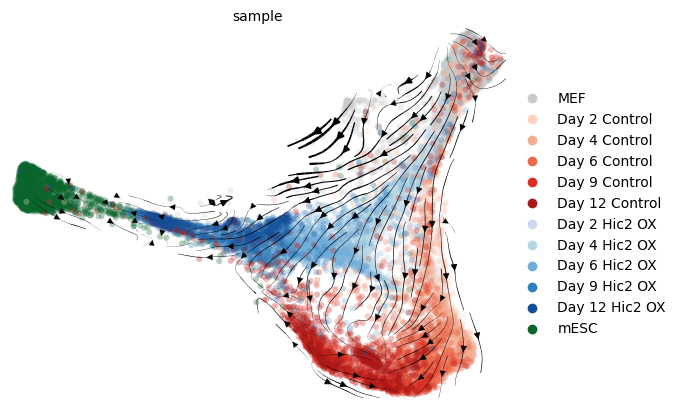

In [9]:
# Plot kernel vector field

combined_kernel.plot_projection(basis="fdl", color="sample", legend_loc="right margin")

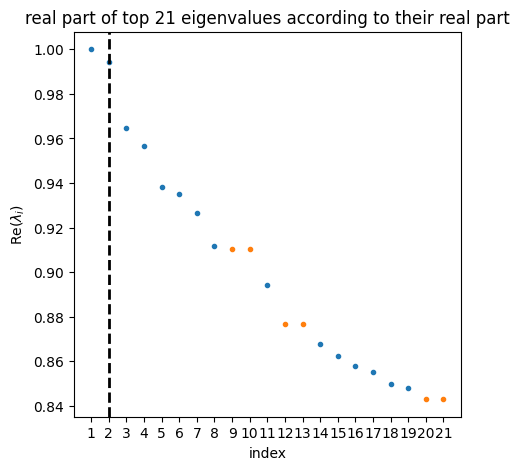

In [10]:
estimator = cellrank.estimators.GPCCA(combined_kernel)
estimator.compute_schur()
estimator.plot_spectrum(real_only=True)

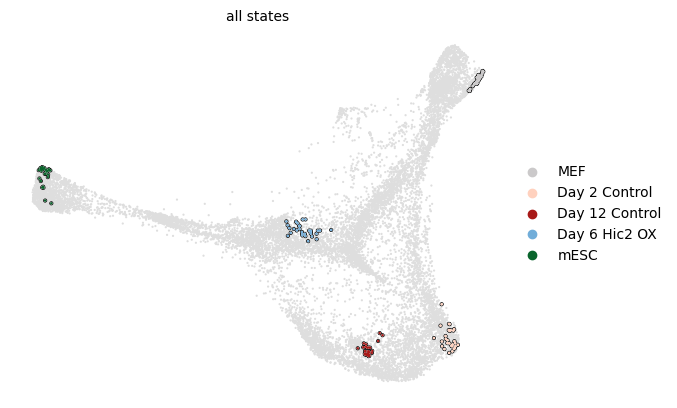

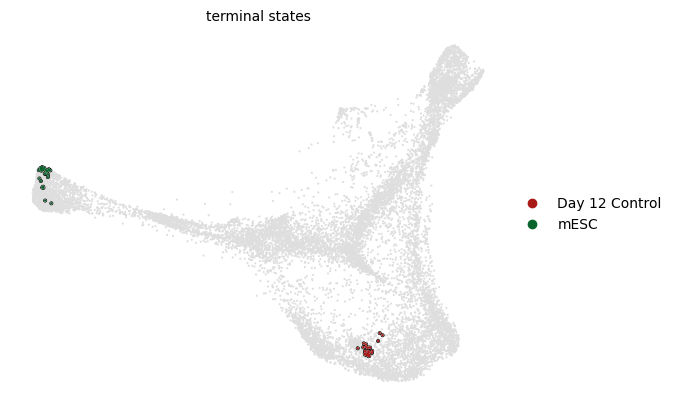

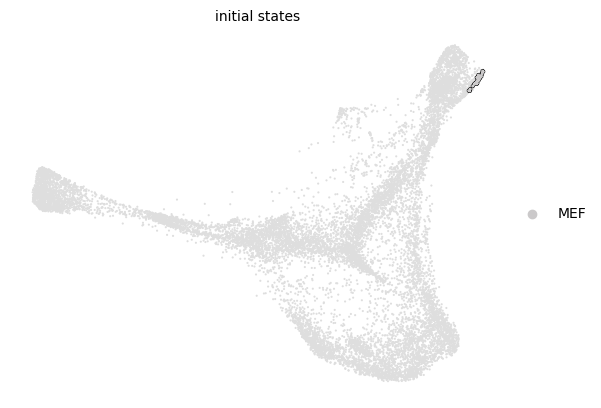

In [11]:
estimator = cellrank.estimators.GPCCA(combined_kernel)
estimator.fit(n_states=[4, 10], cluster_key="sample")

estimator.plot_macrostates(which="all", legend_loc="right", s=10, basis="fdl")
macrostates = estimator.macrostates_memberships.names

# Predict terminal states

estimator.predict_terminal_states(method="eigengap")
estimator.plot_macrostates(which="terminal", legend_loc="right", discrete=True, basis="fdl")
terminal_states = estimator.terminal_states_memberships.names

# Predict initial states

estimator.predict_initial_states()
estimator.plot_macrostates(which="initial", legend_loc="right", basis="fdl", discrete=True)
initial_states = estimator.initial_states_memberships.names

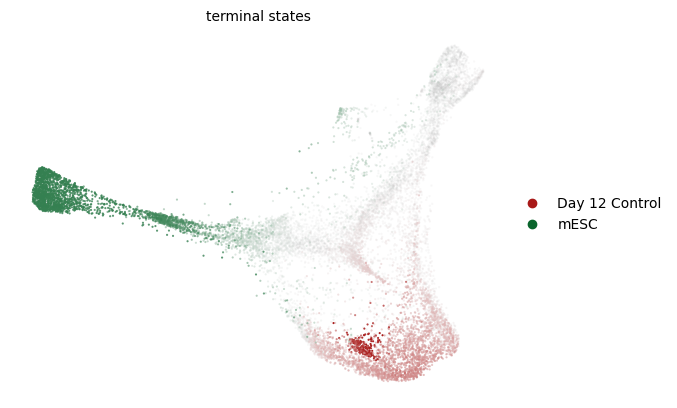

In [12]:
# Plot probability of cells belonging to the terminal states

estimator.plot_macrostates(which="terminal", legend_loc="right", discrete=False, basis="fdl")

In [13]:
# Plot stability values. These are used to find terminal states with method="stability" and show that Day 4 control and Day 9 Hic2 OX are metastable

stability_values = estimator.coarse_T.values.diagonal()

stability_df = pandas.DataFrame({
    "Macrostate": macrostates,
    "Stability": stability_values
}).sort_values("Stability", ascending=False)

print(stability_df)

       Macrostate  Stability
4            mESC   0.998798
2  Day 12 Control   0.981956
1   Day 2 Control   0.969982
3   Day 6 Hic2 OX   0.966000
0             MEF   0.937341


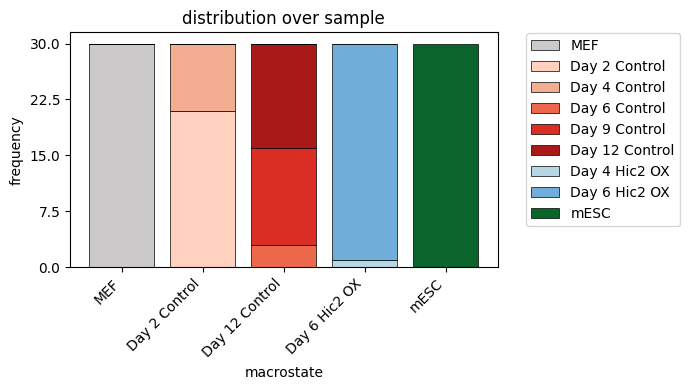

In [14]:
estimator.plot_macrostate_composition(key="sample", figsize=(7, 4))

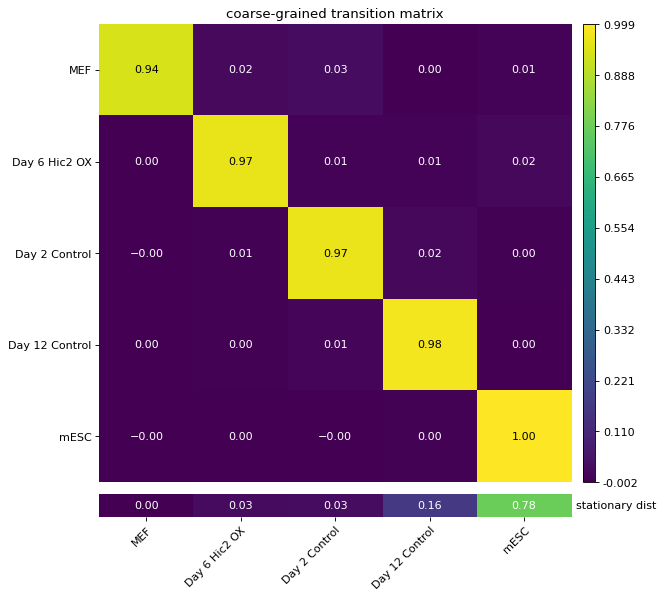

In [15]:
estimator.plot_coarse_T()

  0%|          | 0/2 [00:00<?, ?/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


  0%|          | 0/2 [00:00<?, ?/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


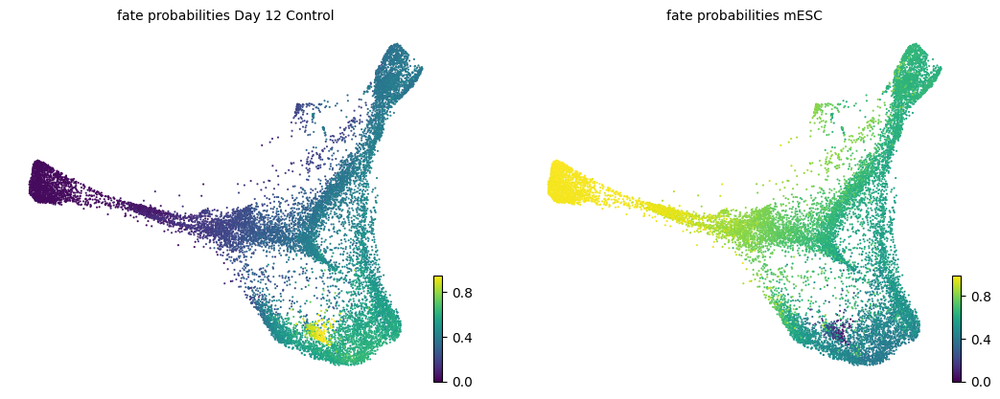

In [16]:
# Estimate fate probabilities

estimator.compute_fate_probabilities()

# Add fate probabilities to adata
for terminal_state in terminal_states:
    adata.obs[f"fate_probabilities_{terminal_state}"] = estimator.fate_probabilities[terminal_state].X.flatten()
estimator.compute_fate_probabilities()
estimator.plot_fate_probabilities(same_plot=False, basis="fdl")

In [17]:
# Drivers in all groups

driver_df = estimator.compute_lineage_drivers()
corr_columns = [state+"_corr" for state in terminal_states]

driver_df.sort_values("Day 12 Control_corr", ascending=False).head(20)[corr_columns]

,Day 12 Control_corr,mESC_corr
gene_names,,
B2m,0.672084,-0.672106
Cd24a,0.649863,-0.649872
Prr13,0.647834,-0.647832
Ctsz,0.645339,-0.645345
Pcolce,0.610722,-0.610706
Crip2,0.608504,-0.608503
Emp3,0.601494,-0.601516
Cdkn1a,0.599448,-0.599461
Gsto1,0.596530,-0.596531


In [18]:
# Drivers in reprogramming groups

reprogramming_groups = ["Hic2", "control"]

driver_df = estimator.compute_lineage_drivers(
    cluster_key="group", clusters=reprogramming_groups
)
corr_columns = [state+"_corr" for state in terminal_states]

driver_df.sort_values("Day 12 Control_corr", ascending=False).head(20)[corr_columns]

,Day 12 Control_corr,mESC_corr
gene_names,,
Cd24a,0.666145,-0.666162
Lmo1,0.591416,-0.591415
Crip2,0.579631,-0.579640
Ctsz,0.574879,-0.574909
Lgals7,0.573642,-0.573639
Rtn4r,0.570925,-0.570925
Tmem238,0.536201,-0.536205
S100a16,0.525240,-0.525245
Pcolce2,0.525131,-0.525128


# Drivers in control group

In [19]:
driver_df = estimator.compute_lineage_drivers(
    cluster_key="group", clusters="control"
)
corr_columns = [state+"_corr" for state in terminal_states]

driver_df.sort_values("Day 12 Control_corr", ascending=False).head(20)[corr_columns]

,Day 12 Control_corr,mESC_corr
gene_names,,
Uchl1,0.566955,-0.566974
Ctsz,0.512857,-0.512846
Crb3,0.498814,-0.498823
Dsp,0.486982,-0.486979
Shisa8,0.479943,-0.479943
Dkkl1,0.471424,-0.471418
Ifi30,0.470291,-0.470295
Krt8,0.460271,-0.460267
Perp,0.456000,-0.456015


In [20]:
# GO analysis

rank_data = driver_df[["Day 12 Control_corr"]].sort_values('Day 12 Control_corr', ascending=False).dropna()

# Run GSEA Prerank
pre_res = gseapy.prerank(
    rnk=rank_data, 
    gene_sets="GO_Biological_Process_2025",
    threads=16,
    min_size=5,
    max_size=1000,
    permutation_num=2000
)

print("Control drivers:")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(20)[["Term", "ES", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]]) # Top Day 12

print("mESC drivers:")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20)[["Term", "ES", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]]) # Top Day 12

Control drivers:


,Term,ES,NES,NOM p-val,FWER p-val,FDR q-val
0,Antigen Processing and Presentation of Peptide...,0.848102,1.983506,0.001538,0.4915,0.196189
1,Antigen Processing and Presentation of Exogeno...,0.848102,1.983506,0.001538,0.4915,0.196189
2,Antigen Processing and Presentation of Exogeno...,0.848102,1.983506,0.001538,0.4915,0.196189
3,Peptide Hormone Processing (GO:0016486),0.764016,1.958075,0.001471,0.5725,0.18742
5,Epidermis Development (GO:0008544),0.520141,1.860086,0.006098,0.844,0.370735
7,Intracellular Iron Ion Homeostasis (GO:0006879),0.678958,1.809602,0.009788,0.9345,0.468967
9,Regulation of Glycolytic Process (GO:0006110),0.666941,1.781466,0.016051,0.9645,0.497586
16,Antigen Processing and Presentation of Peptide...,0.749155,1.650479,0.034003,0.9975,1.0
17,Protein Tetramerization (GO:0051262),0.741614,1.640803,0.032012,0.9985,0.950048
18,Protein Catabolic Process (GO:0030163),0.505614,1.640672,0.027985,0.9985,0.855526


mESC drivers:


,Term,ES,NES,NOM p-val,FWER p-val,FDR q-val
4,Chromatin Organization (GO:0006325),-0.612764,-1.882898,0.000632,0.2065,0.302938
6,Male Meiotic Nuclear Division (GO:0007140),-0.91936,-1.816271,0.0,0.4625,0.439766
8,Regulation of Protein Catabolic Process (GO:00...,-0.619437,-1.79473,0.002045,0.571,0.405606
10,Response to Reactive Oxygen Species (GO:0000302),-0.663375,-1.749411,0.00409,0.796,0.597288
11,Negative Regulation of Leukocyte Activation (G...,-0.871213,-1.699464,0.000752,0.9395,0.926606
12,Regulation of Small GTPase Mediated Signal Tra...,-0.615833,-1.692196,0.003362,0.952,0.843308
13,Cellular Response to Transforming Growth Facto...,-0.513225,-1.681702,0.004356,0.9635,0.820972
14,Defense Response to Virus (GO:0051607),-0.507397,-1.655782,0.004255,0.986,0.9723
15,Transforming Growth Factor Beta Receptor Signa...,-0.529792,-1.653287,0.004416,0.9865,0.890794
19,Negative Regulation of Cell Migration (GO:0030...,-0.456075,-1.635568,0.004805,0.996,0.98359


In [21]:
# Less detailed enrichment analysis

rank_data = driver_df[["Day 12 Control_corr"]].sort_values('Day 12 Control_corr', ascending=False).dropna()

# Run GSEA Prerank
pre_res = gseapy.prerank(
    rnk=rank_data, 
    gene_sets="MSigDB_Hallmark_2020",
    threads=16,
    min_size=5,
    max_size=1000,
    permutation_num=2000
)

print("Control drivers:")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(20)[["Term", "ES", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]]) # Top Day 12

print("mESC drivers:")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20)[["Term", "ES", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]]) # Top Day 12

Control drivers:


,Term,ES,NES,NOM p-val,FWER p-val,FDR q-val
0,p53 Pathway,0.372779,1.719679,0.0,0.109,0.229271
2,mTORC1 Signaling,0.395336,1.635119,0.0,0.1735,0.188366
5,Myc Targets V1,0.698624,1.505195,0.059451,0.326,0.270344
7,Estrogen Response Late,0.319377,1.443182,0.030405,0.4315,0.292649
8,Estrogen Response Early,0.319763,1.423078,0.025974,0.476,0.264621
9,Cholesterol Homeostasis,0.362501,1.391688,0.070776,0.5235,0.251996
14,Wnt-beta Catenin Signaling,0.527454,1.299444,0.170968,0.681,0.35076
15,Androgen Response,0.345958,1.290549,0.121281,0.6945,0.319919
20,UV Response Up,0.293332,1.230255,0.145889,0.7955,0.379537
23,PI3K/AKT/mTOR Signaling,0.349445,1.17487,0.220503,0.8725,0.445816


mESC drivers:


,Term,ES,NES,NOM p-val,FWER p-val,FDR q-val
1,Epithelial Mesenchymal Transition,-0.421316,-1.712771,0.0,0.0905,0.068542
3,UV Response Dn,-0.455801,-1.626227,0.002356,0.236,0.099187
4,Interferon Alpha Response,-0.481333,-1.612156,0.00426,0.2695,0.077729
6,Oxidative Phosphorylation,-0.685724,-1.49482,0.036136,0.613,0.193115
10,Angiogenesis,-0.475327,-1.372162,0.095238,0.9145,0.407336
11,G2-M Checkpoint,-0.404995,-1.357305,0.080516,0.934,0.376196
12,Interferon Gamma Response,-0.363753,-1.341383,0.06763,0.951,0.35903
13,Mitotic Spindle,-0.392098,-1.306757,0.101631,0.977,0.393845
16,Apical Junction,-0.354241,-1.260875,0.143026,0.9935,0.464684
17,Spermatogenesis,-0.499912,-1.245354,0.202939,0.9975,0.456041


In [22]:
# Cell types

rank_data = driver_df[["Day 12 Control_corr"]].sort_values('Day 12 Control_corr', ascending=False).dropna()

# Run GSEA Prerank
pre_res = gseapy.prerank(
    rnk=rank_data, 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=16,
    min_size=5,
    max_size=1000,
    permutation_num=2000
)

print("Control drivers:")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(20)[["Term", "ES", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]]) # Top Day 12

print("mESC drivers:")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20)[["Term", "ES", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]]) # Top Day 12

Control drivers:


,Term,ES,NES,NOM p-val,FWER p-val,FDR q-val
0,Luminal Epithelial Cells,0.63278,2.699429,0.0,0.0,0.0
1,Gastric Chief Cells,0.753632,2.668949,0.0,0.0,0.0
2,Keratinocytes,0.611859,2.625648,0.0,0.0,0.0
3,Mammary Epithelial Cells,0.615601,2.606447,0.0,0.0,0.0
4,Salivary Mucous Cells,0.643755,2.533378,0.0,0.0,0.0
5,Trichocytes,0.627167,2.525921,0.0,0.0,0.0
6,Urothelial Cells,0.781836,2.44572,0.0,0.0,0.0
7,Cholangiocytes,0.623472,2.428215,0.0,0.0,0.0
8,Sebocytes,0.607754,2.402167,0.0,0.0005,0.000131
9,Hepatoblasts,0.674117,2.370934,0.0,0.0005,0.000118


mESC drivers:


,Term,ES,NES,NOM p-val,FWER p-val,FDR q-val
16,Osteocytes,-0.584378,-2.065607,0.0,0.0015,0.000968
19,Pluripotent Stem Cells,-0.648713,-1.988344,0.0,0.005,0.001614
20,Airway Smooth Muscle Cells,-0.498956,-1.861264,0.0,0.046,0.011403
23,Myoblasts,-0.511282,-1.855733,0.000575,0.0485,0.009117
26,Myofibroblasts,-0.486186,-1.8229,0.0,0.0785,0.011812
27,Osteoblasts,-0.46322,-1.804263,0.0,0.099,0.012532
28,Pancreatic Stellate Cells,-0.468531,-1.781399,0.0,0.1295,0.014799
30,Fibroblasts,-0.431567,-1.757707,0.0,0.171,0.017669
31,Chondrocytes,-0.451021,-1.75196,0.0,0.188,0.017248
32,Mesangial Cells,-0.448805,-1.750248,0.000556,0.1915,0.015781


In [23]:
# Get libraries

panglao_lib = gseapy.get_library(name='PanglaoDB_Augmented_2021', organism='Mouse')
go_lib = gseapy.get_library(name='GO_Biological_Process_2025', organism='Mouse')
go_molecular_function = gseapy.get_library(name='GO_Molecular_Function_2025', organism='Mouse')
hallmark_lib = gseapy.get_library(name='MSigDB_Hallmark_2020', organism='Mouse')

In [24]:
# Specific gene groups
target_sets = {
    "Apoptosis Activation": go_lib["Positive Regulation of Apoptotic Process (GO:0043065)"],
    "Apoptosis Inhibition": go_lib["Negative Regulation of Apoptotic Process (GO:0043066)"],
    "Cell Cycle Inhibition": go_lib["Negative Regulation of Cell Cycle (GO:0045786)"],
    "Cell Cycle Activation": go_lib["Positive Regulation of Cell Cycle (GO:0045787)"],
    "Apoptosis Signaling Inhibition": go_lib["Negative Regulation of Apoptotic Signaling Pathway (GO:2001234)"],
    "Apoptosis Signaling Activation": go_lib["Positive Regulation of Apoptotic Signaling Pathway (GO:2001235)"],
    "Stem Cell Proliferation": go_lib["Positive Regulation of Stem Cell Proliferation (GO:2000648)"],
    "Stem Cell Inhibited Proliferation": go_lib["Negative Regulation of Stem Cell Population Maintenance (GO:1902455)"],
    "Stem Cell Inhibited Differentiation": go_lib["Negative Regulation of Stem Cell Differentiation (GO:2000737)"],
    "Stem Cell Differentiation": go_lib["Positive Regulation of Stem Cell Differentiation (GO:2000738)"],
    "DNA Damage Response": go_lib["DNA Damage Response (GO:0006974)"],
    "DNA_Repair": hallmark_lib['DNA Repair'],
    "P53_Pathway": hallmark_lib['p53 Pathway'],
    "Keratinocytes": panglao_lib["Keratinocytes"],
    "Epithelial cells": panglao_lib["Epithelial Cells"]
}

rank_data = driver_df[["Day 12 Control_corr"]].sort_values('Day 12 Control_corr', ascending=False).dropna()

# Run GSEA Prerank
pre_res = gseapy.prerank(
    rnk=rank_data, 
    gene_sets=target_sets,
    threads=16,
    min_size=5,
    max_size=2000,
    permutation_num=1000,
    seed=0
)

pre_res.res2d.sort_values("NES", ascending=False).head(20)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Keratinocytes,0.611859,2.544693,0.0,0.002107,0.001,20/41,13.75%,Perp;Lgals7;Lad1;Ovol1;Pkp1;Aqp3;Itgb4;Gjb5;S1...
1,prerank,Epithelial cells,0.483843,2.378433,0.0,0.001053,0.001,25/67,14.05%,Crb3;Krt8;Mal2;Lad1;Ovol1;Dgat2;Aqp3;Misp;Rab2...
2,prerank,P53_Pathway,0.372779,1.7724,0.0,0.018961,0.027,19/60,11.88%,Ifi30;Perp;Cdkn1a;Ndrg1;Nupr1;Atf3;Pdgfa;Itgb4...
7,prerank,Apoptosis Signaling Activation,0.387242,1.132089,0.310954,0.398701,0.515,2/11,4.23%,Nupr1;Bbc3
8,prerank,DNA Damage Response,0.260692,0.974521,0.482456,0.59073,0.765,5/24,6.80%,Taok3;Myc;Bbc3;Rassf1;Ppp1r15a
12,prerank,Cell Cycle Activation,0.16052,0.533545,0.987288,0.989115,0.941,2/16,8.96%,Nupr1;Lef1
11,prerank,Cell Cycle Inhibition,-0.250893,-0.655684,0.92074,0.930063,1.0,6/14,33.79%,Bmp4;Cdkn1c;Tgfb1;Ets1;Brca1;Gata3
10,prerank,Apoptosis Inhibition,-0.233848,-0.923952,0.639471,0.697449,0.999,46/107,38.42%,Mdk;Fstl1;Tsc22d1;Vegfb;Thbs1;Prdx5;Unc5b;Ptma...
9,prerank,Apoptosis Signaling Inhibition,-0.361649,-0.960588,0.521262,0.756127,0.998,6/14,37.01%,Thbs1;Gpx1;Bmp4;Bdnf;Tcf7l2;Igf1
6,prerank,DNA_Repair,-0.574191,-1.26263,0.154712,0.262707,0.772,4/7,17.98%,Gpx4;Bcam;Arl6ip1;Pold4


In [25]:
# How specific genes correlate with terminal states
genes_of_interest = ["Krtdap", "Krt8", "Krt14", "Nanog", "Tet1", "Cdh1", "Ovol1", "Atf3", "Hic2"]
terminal_states = list(adata.obs["term_states_fwd"].dropna().unique())
corr_columns = [state+"_corr" for state in terminal_states]
driver_df.loc[genes_of_interest]

,Day 12 Control_corr,Day 12 Control_pval,Day 12 Control_qval,Day 12 Control_ci_low,Day 12 Control_ci_high,mESC_corr,mESC_pval,mESC_qval,mESC_ci_low,mESC_ci_high
gene_names,,,,,,,,,,
Krtdap,0.215609,2.736569e-54,9.687747e-54,0.189073,0.241831,-0.215618,2.708426e-54,9.588117e-54,-0.241839,-0.189082
Krt8,0.460271,3.512549e-272,2.683047e-270,0.438187,0.481801,-0.460267,3.566043e-272,2.723908e-270,-0.481796,-0.438182
Krt14,0.187590,3.232066e-41,9.117732e-41,0.160761,0.214143,-0.187592,3.227749e-41,9.105552e-41,-0.214144,-0.160762
Nanog,-0.259601,5.344883e-79,2.793404e-78,-0.285216,-0.233614,0.259600,5.347578e-79,2.794813e-78,0.233614,0.285216
Tet1,-0.473678,4.155877e-291,4.126786e-289,-0.494858,-0.451936,0.473676,4.191344e-291,4.162005e-289,0.451934,0.494855
Cdh1,0.228274,7.256733e-61,2.836982e-60,0.201884,0.254332,-0.228275,7.240705e-61,2.830717e-60,-0.254333,-0.201886
Ovol1,0.364260,4.693325e-161,8.551325e-160,0.340022,0.388014,-0.364259,4.697931e-161,8.559717e-160,-0.388013,-0.340022
Atf3,0.363405,3.096813e-160,5.491313e-159,0.339151,0.387177,-0.363404,3.108386e-160,5.511835e-159,-0.387175,-0.339149
Hic2,-0.097988,3.333240e-12,5.457390e-12,-0.125312,-0.070515,0.097987,3.334459e-12,5.459387e-12,0.070514,0.125312


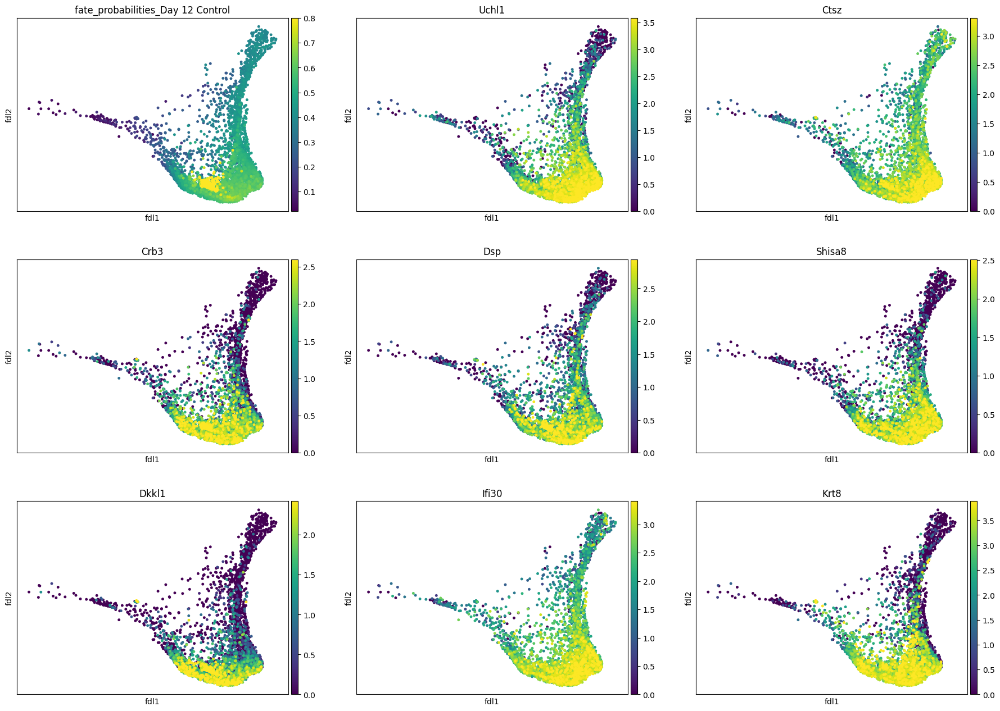

In [26]:
# Visualize driver genes for day 12 control

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata[control_indices],
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + list(driver_df.sort_values(f"{terminal_state}_corr", ascending=False).index[:8]),
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)

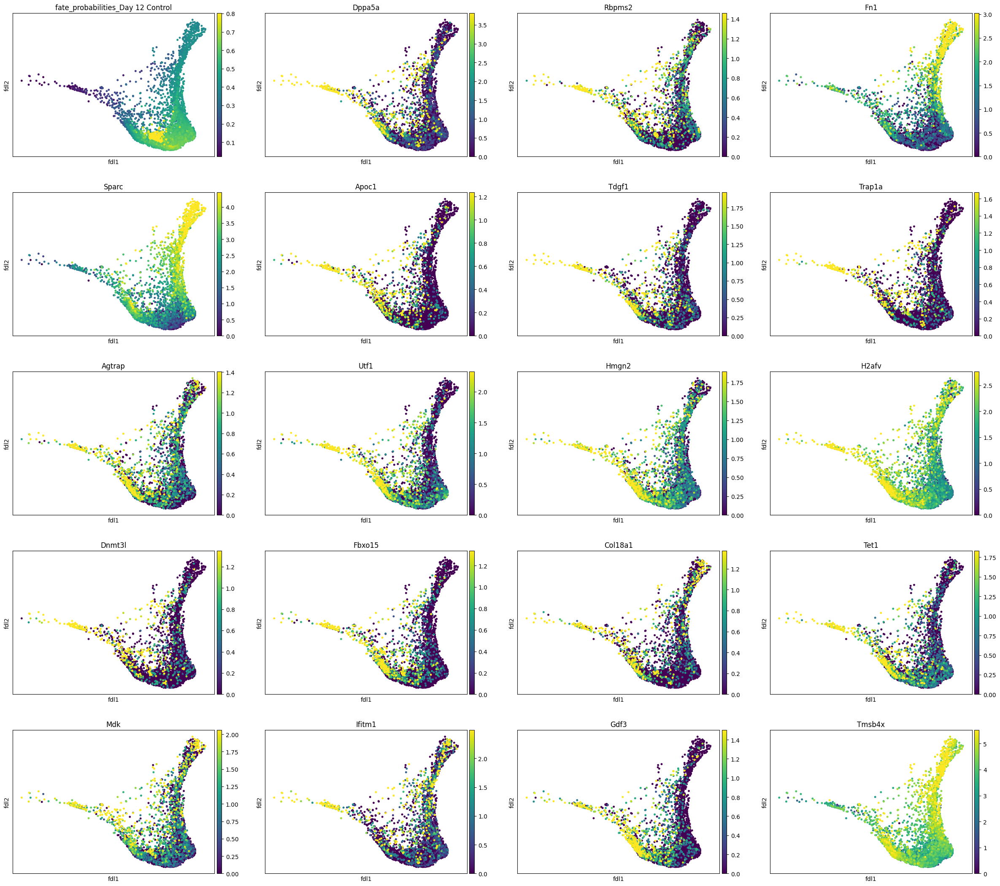

In [30]:
# Visualize driver genes for mESC

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata[control_indices],
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + list(driver_df.sort_values(f"{terminal_state}_corr", ascending=True).index[:19]),
    color_map="viridis",
    s=50,
    ncols=4,
    vmax="p96",
)

  0%|          | 0/20 [00:00<?, ?gene/s]

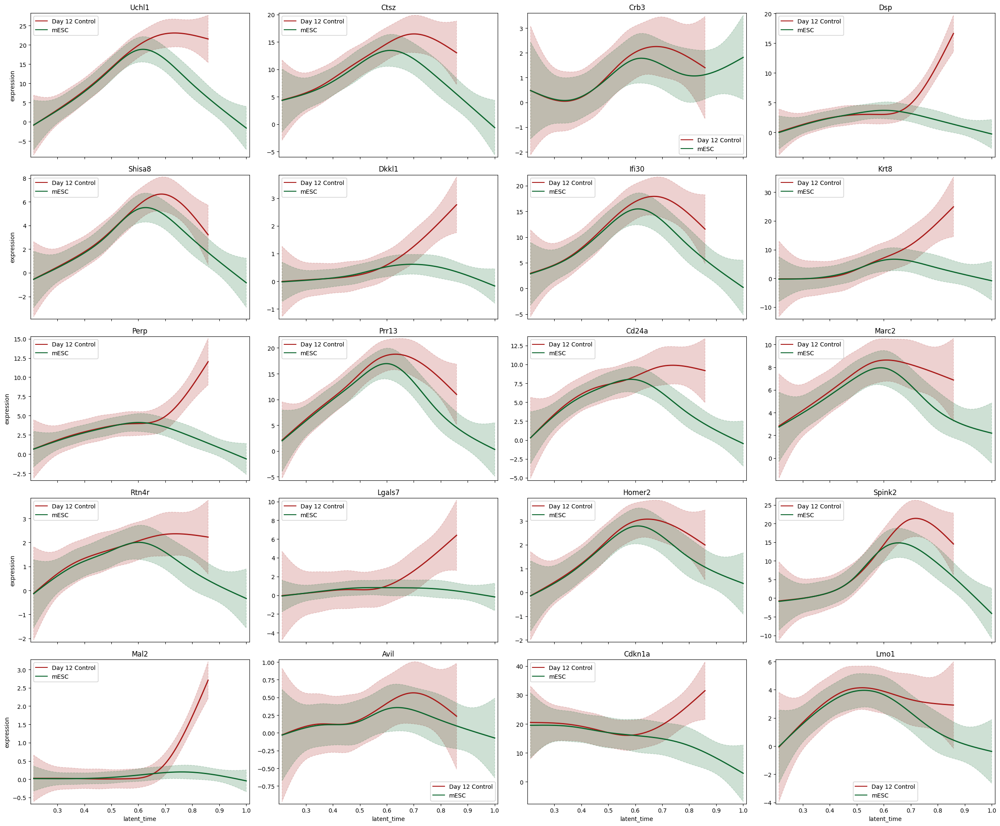

In [104]:
# Plot trends in driver expression

model = cellrank.models.GAMR(adata[control_indices], n_knots=6, smoothing_penalty=10.0)

dead_end = "Day 12 Control"
cellrank.pl.gene_trends(
    adata[control_indices],
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(20).index,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

  0%|          | 0/20 [00:00<?, ?gene/s]

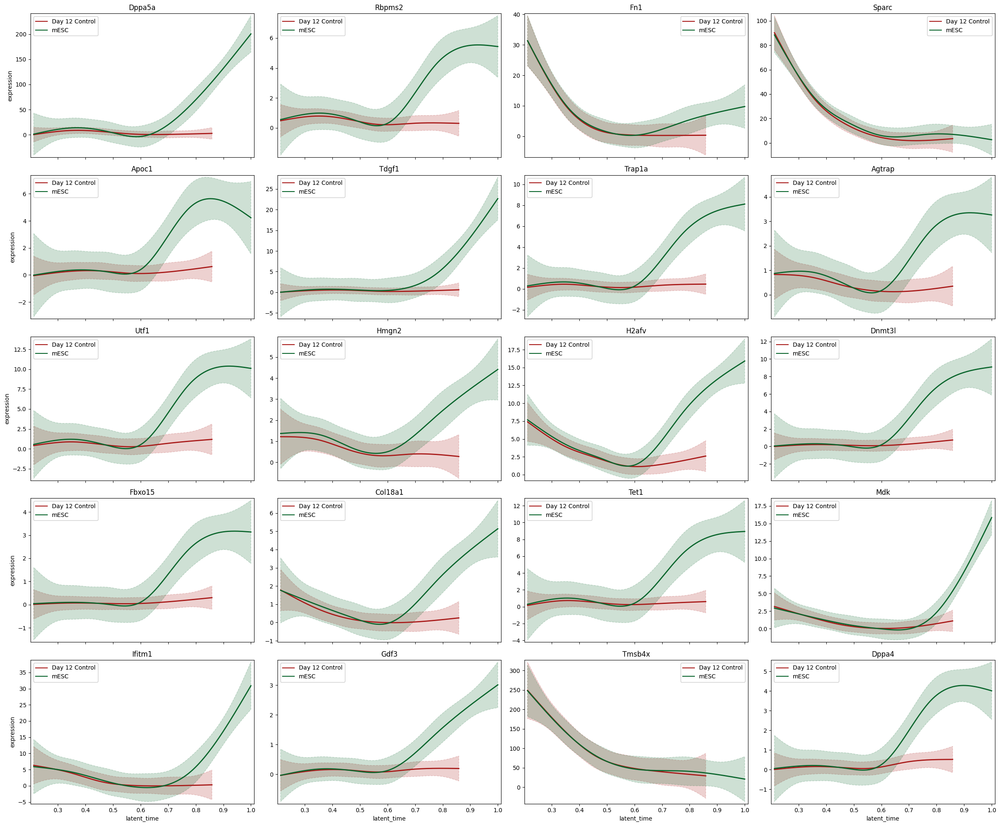

In [110]:
# Plot trends in mESC driver expression

model = cellrank.models.GAMR(adata[control_indices], n_knots=6, smoothing_penalty=10.0)

dead_end = "Day 12 Control"
cellrank.pl.gene_trends(
    adata[control_indices],
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=True).head(20).index,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

In [112]:
# Trends independent of trajectory

def plot_grouped_gene_trend(adata, genes, group_key="group", time_key="latent_time", layer="Ms", groups=None, columns=4, figure_width=14, plot_height=4):
    """
    Plots smoothed gene expression using Generalized Additive Models (GAMs).
    This provides true smooth local regression with confidence intervals.
    """

    number_of_genes = len(genes)
    number_of_columns = min(columns, number_of_genes)
    
    # Calculate rows
    rows = (number_of_genes + number_of_columns - 1) // number_of_columns
    
    figure, axes = pyplot.subplots(rows, number_of_columns)
    figure.set_figwidth(figure_width)
    figure.set_figheight(plot_height * rows)

    # Handle single gene case (axes is not an array) and 1D array case
    if number_of_genes == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()

    # Define colors for groups
    unique_groups = adata.obs[group_key].unique()
    palette = seaborn.color_palette("tab10", n_colors=len(unique_groups))
    color_map = dict(zip(unique_groups, palette))

    for gene_index, gene in enumerate(genes):
        axis = axes_flat[gene_index]
        
        # Fetch expression data
        expr_data = adata[:, gene].layers[layer]
        if hasattr(expr_data, "toarray"):
            expr_data = expr_data.toarray()
        expr_data = expr_data.flatten()
        
        # Create DataFrame
        df = pandas.DataFrame({
            "Latent Time": adata.obs[time_key],
            "Expression": expr_data,
            "Group": adata.obs[group_key]
        })
        
        # Determine which groups to plot
        if groups is None:
            # If no specific list, plot all groups found in the data
            plot_groups = df["Group"].unique()
        else:
            plot_groups = groups

        # Loop through each group and fit a GAM
        for group in plot_groups:
            group_data = df[df["Group"] == group]
            
            # Skip empty groups
            if len(group_data) < 10:
                continue

            # Prepare X and y for pygam (X must be 2D array)
            X = group_data["Latent Time"].values.reshape(-1, 1)
            y = group_data["Expression"].values
            
            # Fit LinearGAM using a Spline term s(0)
            # n_splines=20 gives good flexibility (smoothness)
            gam = pygam.LinearGAM(pygam.s(0, n_splines=6)).fit(X, y)
            
            # Generate a smooth grid for plotting lines
            X_grid = numpy.linspace(X.min(), X.max(), 500)
            
            # Predict values and confidence intervals
            y_pred = gam.predict(X_grid)
            confidence_intervals = gam.confidence_intervals(X_grid, width=0.95)
            
            # Plot Line
            color = color_map[group]
            axis.plot(X_grid, y_pred, label=group, color=color, linewidth=3)
            
            # Plot Confidence Interval (Fill)
            axis.fill_between(
                X_grid, 
                confidence_intervals[:, 0], 
                confidence_intervals[:, 1], 
                color=color, 
                alpha=0.2 # Transparency of CI
            )

        axis.set_title(f"{gene} expression")
        axis.set_xlabel("Latent Time")
        
        # Add legend only to the first plot to avoid clutter
        if gene_index == 0:
            axis.legend()

    # Clean up empty subplots
    for i in range(number_of_genes, len(axes_flat)):
        axes_flat[i].axis('off')

    pyplot.tight_layout()
    pyplot.show()

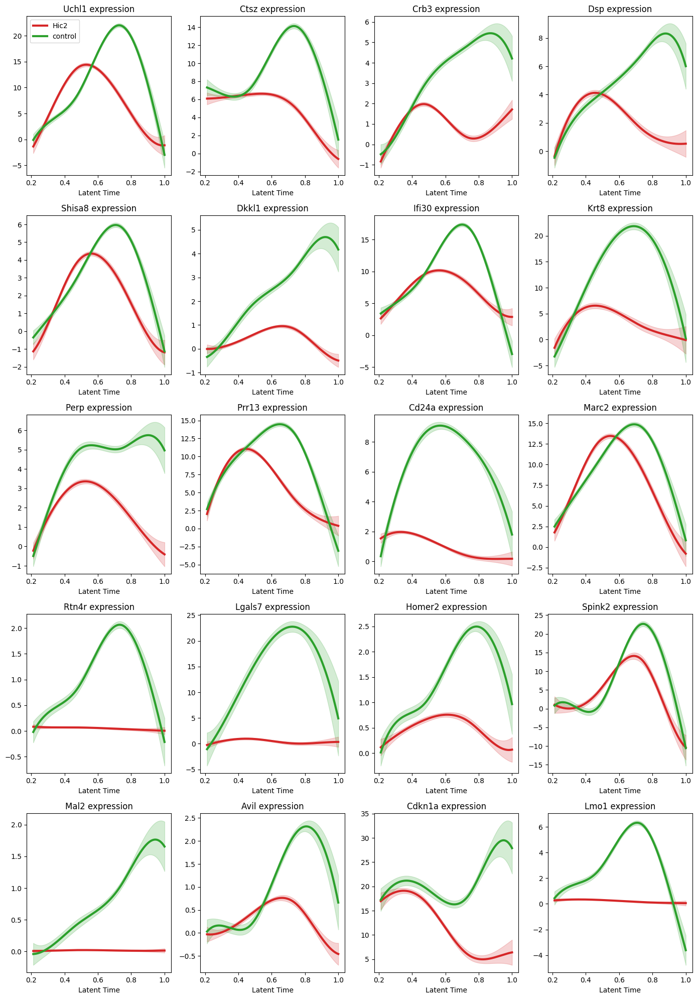

In [113]:
# Control drivers independent of trajectory

control_driver_genes = driver_df.sort_values(f"Day 12 Control_corr", ascending=False).head(20).index

plot_grouped_gene_trend(
    adata, 
    control_driver_genes, 
    group_key="group", 
    layer="spliced", 
    groups=["Hic2", "control"]
)

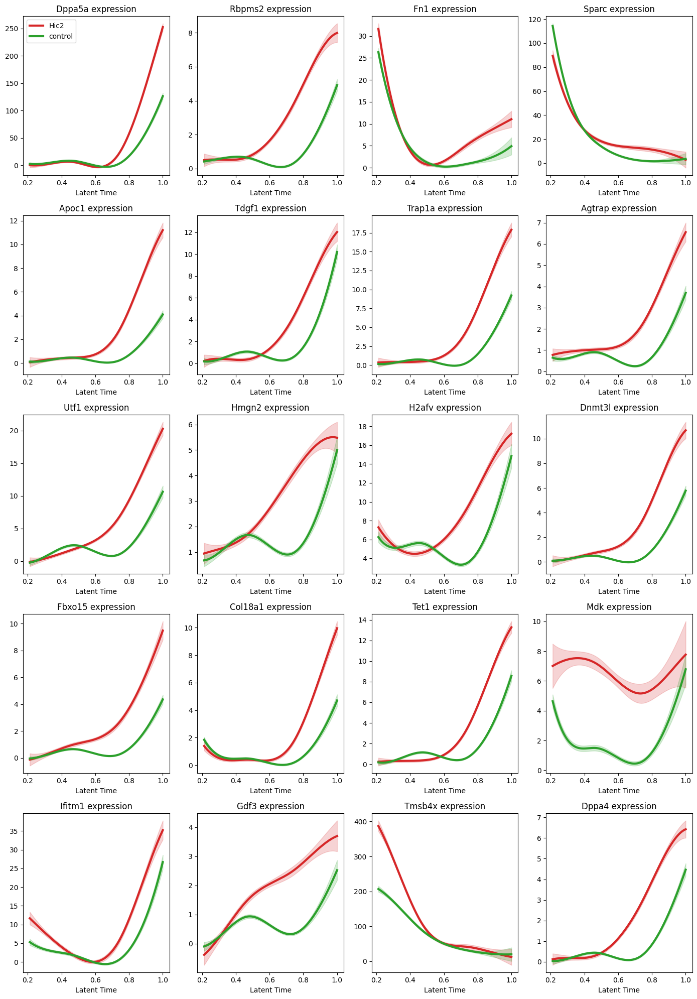

In [106]:
# mESC drivers independent of trajectory

mesc_driver_genes = driver_df.sort_values(f"Day 12 Control_corr", ascending=True).head(20).index

plot_grouped_gene_trend(
    adata, 
    mesc_driver_genes, 
    group_key="group", 
    layer="spliced", 
    groups=["Hic2", "control"]
)

### Applying drivers from control group on Hic2

  0%|          | 0/20 [00:00<?, ?gene/s]

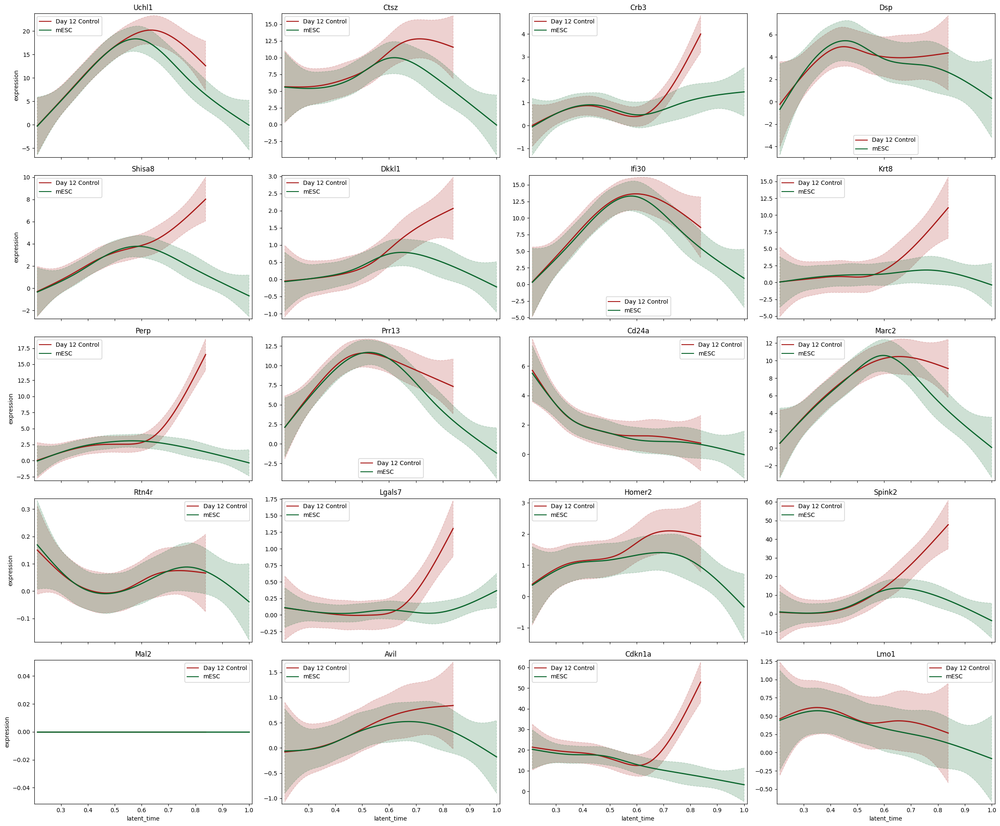

In [108]:
# Control drivers

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

dead_end = "Day 12 Control"
cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(20).index,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

  0%|          | 0/20 [00:00<?, ?gene/s]

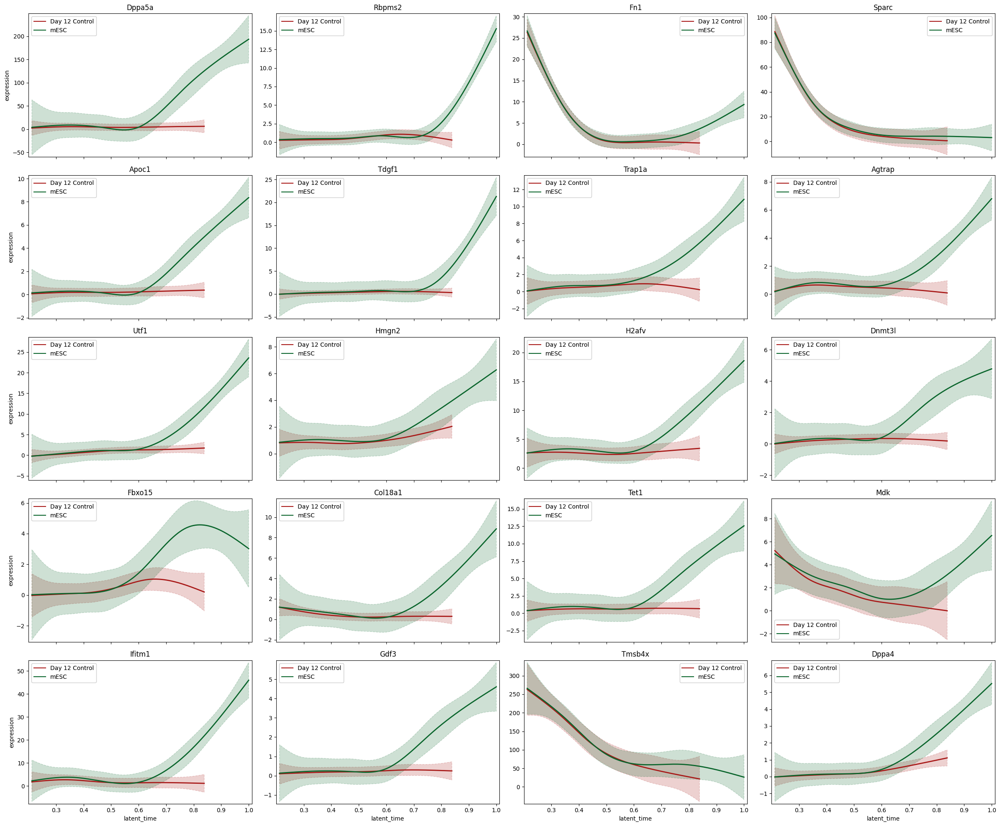

In [109]:
# Reprogramming drivers

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

dead_end = "Day 12 Control"
cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=True).head(20).index,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

# Drivers in Hic2 OX group

In [119]:
driver_df = estimator.compute_lineage_drivers(
    cluster_key="group", clusters="Hic2"
)
corr_columns = [state+"_corr" for state in terminal_states]

driver_df.sort_values("Day 12 Control_corr", ascending=False).head(20)[corr_columns]

,mESC_corr,Day 12 Control_corr
gene_names,,
Anxa5,-0.714815,0.714794
Lmna,-0.701389,0.701402
B2m,-0.699816,0.699811
Ccnd2,-0.675295,0.675290
S100a6,-0.664717,0.664774
Abracl,-0.654753,0.654805
Emp3,-0.654224,0.654221
Vim,-0.649014,0.649044
Esd,-0.647545,0.647592


In [123]:
# GO analysis

rank_data = driver_df[["Day 12 Control_corr"]].sort_values('Day 12 Control_corr', ascending=False).dropna()

# Run GSEA Prerank
pre_res = gseapy.prerank(
    rnk=rank_data, 
    gene_sets="GO_Biological_Process_2025",
    threads=16,
    min_size=5,
    max_size=1000,
    permutation_num=2000
)

print("Control drivers:")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(20))

print("mESC drivers:")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20))

2026-01-28 15:42:50,179 [WARNING] Duplicated values found in preranked stats: 0.30% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Control drivers:


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Collagen Fibril Organization (GO:0030199),0.66647,2.155401,0.0,0.005882,0.004,19/28,25.49%,Col1a1;Col1a2;Col3a1;Lox;Ddr2;Serpinh1;Col5a2;...
2,prerank,Proteolysis Involved in Protein Catabolic Proc...,0.788707,1.964397,0.0,0.075154,0.0965,5/11,7.86%,Isg15;Ctsz;Ctsc;Ctsl;Ctsb
3,prerank,Extracellular Matrix Organization (GO:0030198),0.490496,1.94857,0.0,0.063173,0.119,36/78,25.74%,Col1a1;Col1a2;Col3a1;Lox;App;Flrt2;Ddr2;Mmp14;...
4,prerank,Supramolecular Fiber Organization (GO:0097435),0.466719,1.912771,0.0,0.080546,0.194,43/98,23.39%,B2m;Vim;Dbn1;Col1a1;Tpm2;Rhoc;Col1a2;Col3a1;Lo...
5,prerank,Cell Morphogenesis Involved in Neuron Differen...,0.775672,1.90545,0.0,0.072017,0.211,5/11,8.66%,S100a6;Map1b;Sdc2;App;Shtn1
6,prerank,Negative Regulation of Viral Genome Replicatio...,0.721843,1.848325,0.000987,0.141159,0.417,8/12,15.92%,Isg15;Hmga2;Ifit1;Rsad2;Ifih1;Ccl5;Ifitm3;Isg20
9,prerank,Eye Morphogenesis (GO:0048592),0.776262,1.799058,0.003058,0.241614,0.6335,8/9,21.83%,Fbn1;Fbn2;Col5a2;Efemp1;Col5a1;Mfap5;Tenm3;Mfap2
10,prerank,Negative Regulation of Blood Vessel Morphogene...,0.583226,1.794142,0.001022,0.226362,0.656,15/24,30.30%,Dcn;Ecscr;Thbs1;Sulf1;Rock2;Serpinf1;Tgfb2;Npp...
13,prerank,Antigen Processing and Presentation of Exogeno...,0.860425,1.780696,0.003033,0.198194,0.7155,2/6,7.11%,Ctsl;Ifi30
14,prerank,Antigen Processing and Presentation of Exogeno...,0.860425,1.780696,0.003033,0.198194,0.7155,2/6,7.11%,Ctsl;Ifi30


mESC drivers:


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
1,prerank,Chromatin Organization (GO:0006325),-0.67832,-2.071675,0.0,0.011759,0.016,17/25,12.12%,Jarid2;Tet1;Hmgn2;Kdm5b;Hmgb2;Phc1;Sycp3;Rest;...
8,prerank,Nucleosome Assembly (GO:0006334),-0.857609,-1.810184,0.003984,0.343084,0.684,4/6,11.12%,Hmgb2;Hat1;Kat6b;Nasp
7,prerank,Nucleosome Organization (GO:0034728),-0.857609,-1.810184,0.003984,0.343084,0.684,4/6,11.12%,Hmgb2;Hat1;Kat6b;Nasp
11,prerank,Protein Polyubiquitination (GO:0000209),-0.689769,-1.790509,0.005071,0.337291,0.765,7/13,15.42%,Mkrn1;Trim71;Ifi27;Arrdc4;Brca1;Rnf31;Nedd4
16,prerank,protein-DNA Complex Assembly (GO:0065004),-0.792629,-1.757848,0.011,0.412738,0.874,5/7,17.98%,Hmgb2;Hat1;Kat6b;Nasp;Tcf7l2
18,prerank,Male Meiotic Nuclear Division (GO:0007140),-0.892741,-1.74511,0.003115,0.404472,0.9065,4/5,7.81%,Dnmt3l;Tdrd12;Sycp3;Hsf2bp
19,prerank,Phospholipid Transport (GO:0015914),-0.792444,-1.736291,0.005917,0.386167,0.9225,5/7,10.22%,Apoc1;Apoe;Pla2g10;Pltp;Abcg1
20,prerank,Negative Regulation of Lipid Biosynthetic Proc...,-0.815051,-1.707788,0.003046,0.4704,0.9675,4/6,13.67%,Apoc1;Apoe;Brca1;Nr0b1
21,prerank,Chromatin Remodeling (GO:0006338),-0.617324,-1.703342,0.01165,0.438001,0.9735,9/16,12.12%,Jarid2;Tet1;Mtf2;Kdm5b;Phc1;Rest;Cecr2;Nr5a2;B...
22,prerank,Protein Glycosylation (GO:0006486),-0.677299,-1.702383,0.012072,0.398351,0.974,8/11,28.19%,Tet1;Alg13;St8sia1;Plod1;Tet2;Pmm1;St3gal5;Gfpt2


In [52]:
# Less detailed enrichment analysis

rank_data = driver_df[["Day 12 Control_corr"]].sort_values('Day 12 Control_corr', ascending=False).dropna()

# Run GSEA Prerank
pre_res = gseapy.prerank(
    rnk=rank_data, 
    gene_sets="MSigDB_Hallmark_2020",
    threads=16,
    min_size=5,
    max_size=1000,
    permutation_num=2000
)

print("Control drivers:")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(20)[["Term", "ES", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]]) # Top Day 12

print("mESC drivers:")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20)[["Term", "ES", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]]) # Top Day 12

2026-01-28 15:13:56,720 [WARNING] Duplicated values found in preranked stats: 0.30% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Control drivers:


,Term,ES,NES,NOM p-val,FWER p-val,FDR q-val
0,Epithelial Mesenchymal Transition,0.590422,2.561965,0.0,0.0,0.0
1,Allograft Rejection,0.586898,2.008491,0.001007,0.003,0.002219
3,Angiogenesis,0.669433,1.946009,0.0,0.0075,0.003698
4,Inflammatory Response,0.512992,1.942174,0.0,0.008,0.002959
5,Interferon Gamma Response,0.511442,1.939363,0.0,0.009,0.002663
6,UV Response Dn,0.505931,1.851242,0.001085,0.0235,0.005917
7,Interferon Alpha Response,0.519231,1.777081,0.002083,0.056,0.012257
8,Apoptosis,0.45859,1.767209,0.0,0.061,0.011649
10,Complement,0.451142,1.674861,0.002105,0.147,0.026627
11,Cholesterol Homeostasis,0.511947,1.57886,0.011317,0.307,0.055917


mESC drivers:


,Term,ES,NES,NOM p-val,FWER p-val,FDR q-val
2,G2-M Checkpoint,-0.585163,-1.959349,0.0,0.004,0.00221
9,E2F Targets,-0.555157,-1.732056,0.002871,0.093,0.026934
13,Spermatogenesis,-0.619172,-1.526015,0.044248,0.489,0.127901
15,Mitotic Spindle,-0.449809,-1.510992,0.026897,0.538,0.110014
16,Oxidative Phosphorylation,-0.672449,-1.461491,0.082759,0.6665,0.124862
24,DNA Repair,-0.586424,-1.264161,0.208291,0.9645,0.332044
26,heme Metabolism,-0.408179,-1.206992,0.200971,0.9845,0.379953
29,Bile Acid Metabolism,-0.465819,-1.162223,0.262262,0.994,0.410048
36,Adipogenesis,-0.294176,-0.968808,0.519358,1.0,0.786495
37,KRAS Signaling Dn,-0.292867,-0.940197,0.552314,1.0,0.775829


In [53]:
# Cell types

rank_data = driver_df[["Day 12 Control_corr"]].sort_values('Day 12 Control_corr', ascending=False).dropna()

# Run GSEA Prerank
pre_res = gseapy.prerank(
    rnk=rank_data, 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=16,
    min_size=5,
    max_size=1000,
    permutation_num=2000
)

print("Control drivers:")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(20)[["Term", "ES", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]]) # Top Day 12

print("mESC drivers:")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20)[["Term", "ES", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]]) # Top Day 12

2026-01-28 15:14:20,435 [WARNING] Duplicated values found in preranked stats: 0.30% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Control drivers:


,Term,ES,NES,NOM p-val,FWER p-val,FDR q-val
1,Airway Smooth Muscle Cells,0.622101,2.425652,0.0,0.0,0.0
2,Pancreatic Stellate Cells,0.594415,2.367796,0.0,0.0,0.0
3,Pulmonary Vascular Smooth Muscle Cells,0.593312,2.288557,0.0,0.0,0.0
4,Osteoblasts,0.541651,2.240532,0.0,0.0,0.0
6,Hepatic Stellate Cells,0.557155,2.22233,0.0,0.0,0.0
7,Myofibroblasts,0.558557,2.185854,0.0,0.0,0.0
8,Peritubular Myoid Cells,0.55672,2.150891,0.0,0.001,0.000178
9,Mesangial Cells,0.521983,2.132639,0.0,0.002,0.000312
10,Melanocytes,0.562595,2.132379,0.0,0.002,0.000277
11,Myoblasts,0.558922,2.098002,0.0,0.003,0.000374


mESC drivers:


,Term,ES,NES,NOM p-val,FWER p-val,FDR q-val
0,Pluripotent Stem Cells,-0.824352,-2.513413,0.0,0.0,0.0
5,Epiblast Cells,-0.690732,-2.235715,0.0,0.0,0.0
18,Oxyphil Cells,-0.718372,-2.002961,0.0,0.012,0.003588
25,Embryonic Stem Cells,-0.484042,-1.810709,0.0,0.138,0.032961
28,Germ Cells,-0.649142,-1.779396,0.00994,0.19,0.037901
29,Gamma Delta T Cells,-0.68775,-1.753288,0.008138,0.2405,0.041706
38,Cholangiocytes,-0.51877,-1.620465,0.012138,0.591,0.123884
39,Clara Cells,-0.621961,-1.617328,0.027,0.597,0.111569
40,Reticulocytes,-0.722419,-1.572704,0.036019,0.7175,0.142652
55,Airway Epithelial Cells,-0.571323,-1.367691,0.106061,0.987,0.535033


In [120]:
# Specific gene groups
target_sets = {
    "Apoptosis Activation": go_lib["Positive Regulation of Apoptotic Process (GO:0043065)"],
    "Apoptosis Inhibition": go_lib["Negative Regulation of Apoptotic Process (GO:0043066)"],
    "Cell Cycle Inhibition": go_lib["Negative Regulation of Cell Cycle (GO:0045786)"],
    "Cell Cycle Activation": go_lib["Positive Regulation of Cell Cycle (GO:0045787)"],
    "Apoptosis Signaling Inhibition": go_lib["Negative Regulation of Apoptotic Signaling Pathway (GO:2001234)"],
    "Apoptosis Signaling Activation": go_lib["Positive Regulation of Apoptotic Signaling Pathway (GO:2001235)"],
    "Stem Cell Proliferation": go_lib["Positive Regulation of Stem Cell Proliferation (GO:2000648)"],
    "Stem Cell Inhibited Proliferation": go_lib["Negative Regulation of Stem Cell Population Maintenance (GO:1902455)"],
    "Stem Cell Inhibited Differentiation": go_lib["Negative Regulation of Stem Cell Differentiation (GO:2000737)"],
    "Stem Cell Differentiation": go_lib["Positive Regulation of Stem Cell Differentiation (GO:2000738)"],
    "DNA Damage Response": go_lib["DNA Damage Response (GO:0006974)"],
    "DNA_Repair": hallmark_lib['DNA Repair'],
    "P53_Pathway": hallmark_lib['p53 Pathway'],
    "Keratinocytes": panglao_lib["Keratinocytes"],
    "Epithelial cells": panglao_lib["Epithelial Cells"]
}

rank_data = driver_df[["Day 12 Control_corr"]].sort_values('Day 12 Control_corr', ascending=False).dropna()

# Run GSEA Prerank
pre_res = gseapy.prerank(
    rnk=rank_data, 
    gene_sets=target_sets,
    threads=16,
    min_size=5,
    max_size=2000,
    permutation_num=1000,
    seed=0
)

pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-01-28 15:40:55,740 [WARNING] Duplicated values found in preranked stats: 0.30% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Apoptosis Signaling Activation,0.629685,1.547247,0.030246,0.181532,0.119,6/11,19.08%,Nupr1;Tnfrsf12a;App;Cav1;Wnt5a;Clu
2,prerank,Apoptosis Activation,0.365333,1.391289,0.03268,0.313426,0.359,32/63,28.74%,Nupr1;Tnfrsf12a;Ecscr;Thbs1;Phlda1;App;Phlda3;...
4,prerank,Apoptosis Signaling Inhibition,0.513448,1.336046,0.124521,0.291207,0.458,6/14,19.08%,Thbs1;Gpx1;Lgals3;Plaur;Bdnf;Clu
6,prerank,P53_Pathway,0.31886,1.20801,0.130435,0.434683,0.702,11/60,9.56%,Ccnd2;Nupr1;Cdkn1a;Tm4sf1;Sat1;App;Phlda3;Ifi3...
7,prerank,Apoptosis Inhibition,0.284345,1.180451,0.121739,0.396817,0.743,37/107,27.59%,Anxa5;Ccnd2;Anxa1;Nupr1;Cd44;Hmga2;Flna;Fstl1;...
8,prerank,Cell Cycle Inhibition,0.319522,0.843633,0.695565,1.0,0.991,5/14,27.69%,Nupr1;Nr2f2;Cdkn2a;Tgfb1;Ets1
9,prerank,Cell Cycle Activation,0.283963,0.800883,0.744597,1.0,0.993,3/16,12.72%,Nupr1;App;Tgfb2
10,prerank,Keratinocytes,0.229197,0.792543,0.83878,0.899149,0.993,5/41,10.27%,Fst;Krtdap;Plec;Perp;Ccl2
12,prerank,Stem Cell Differentiation,0.316345,0.64257,0.920892,0.946896,0.995,2/6,12.72%,Ptn;Tgfb2
11,prerank,Stem Cell Proliferation,-0.345334,-0.77352,0.743346,0.824016,0.997998,2/8,8.41%,Nanog;Epcam


In [124]:
# How specific genes correlate with terminal states
genes_of_interest = ["Krtdap", "Krt8", "Krt14", "Nanog", "Tet1", "Cdh1", "Ovol1", "Atf3"]
terminal_states = list(adata.obs["term_states_fwd"].dropna().unique())
corr_columns = [state+"_corr" for state in terminal_states]
driver_df.loc[genes_of_interest]

,Day 12 Control_corr,Day 12 Control_pval,Day 12 Control_qval,Day 12 Control_ci_low,Day 12 Control_ci_high,mESC_corr,mESC_pval,mESC_qval,mESC_ci_low,mESC_ci_high
gene_names,,,,,,,,,,
Krtdap,0.400192,3.551025e-179,3.732314e-178,0.375465,0.424350,-0.400203,3.466585e-179,3.654754e-178,-0.424360,-0.375476
Krt8,-0.092260,4.664071e-10,7.603388e-10,-0.121034,-0.063330,0.092261,4.661932e-10,7.599901e-10,0.063331,0.121035
Krt14,0.090246,1.106069e-09,1.788518e-09,0.061308,0.119033,-0.090246,1.105976e-09,1.788368e-09,-0.119033,-0.061308
Nanog,-0.491366,3.321577e-287,7.289220e-286,-0.513128,-0.468972,0.491364,3.338386e-287,7.326107e-286,0.468970,0.513127
Tet1,-0.644818,0.000000e+00,0.000000e+00,-0.661505,-0.627493,0.644816,0.000000e+00,0.000000e+00,0.627490,0.661503
Cdh1,-0.254482,9.992264e-69,3.874670e-68,-0.281497,-0.227064,0.254483,9.982208e-69,3.870771e-68,0.227065,0.281498
Ovol1,0.098091,3.443504e-11,5.749731e-11,0.069189,0.126828,-0.098091,3.442579e-11,5.748185e-11,-0.126829,-0.069189
Atf3,0.190920,1.001509e-38,2.717409e-38,0.162725,0.218804,-0.190920,1.001495e-38,2.717372e-38,-0.218804,-0.162725


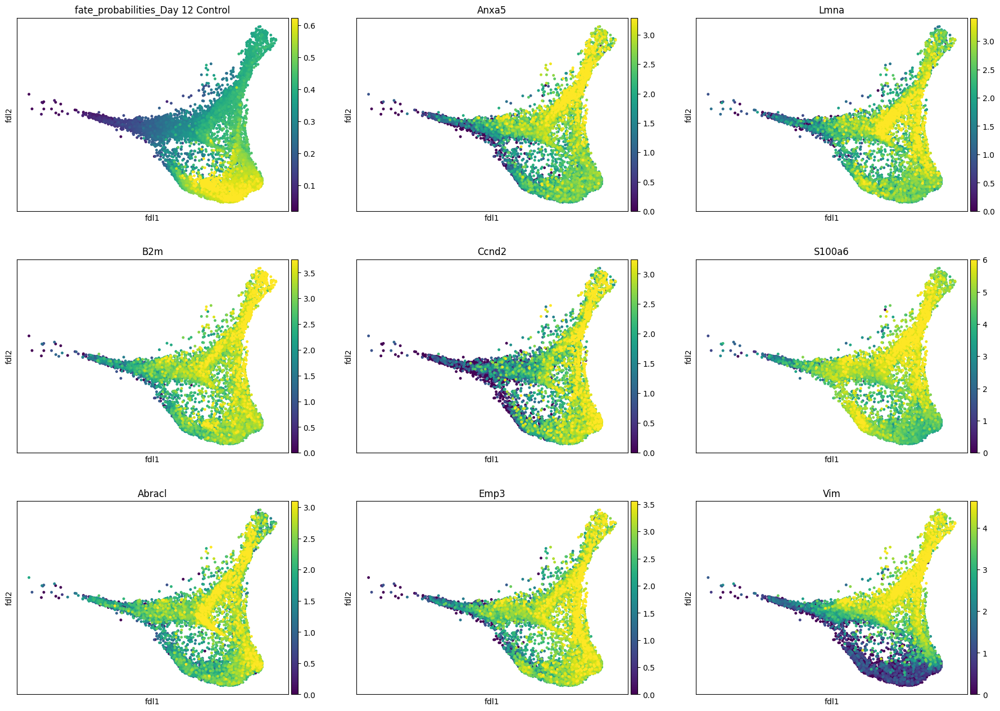

In [64]:
# Visualize driver genes for day 12 control

hic2_indices = adata.obs["group"] == "Hic2"
terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata[reprogramming_group_indices],
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + list(driver_df.sort_values(f"{terminal_state}_corr", ascending=False).index[:8]),
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)

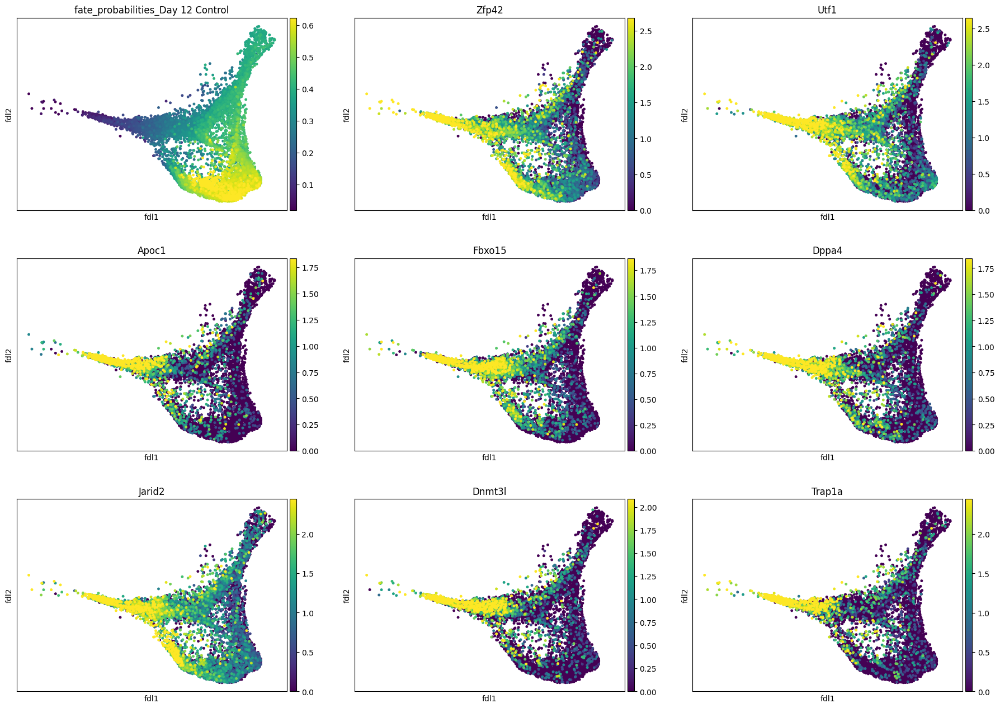

In [ ]:
# Visualize pluripotency drivers

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata[reprogramming_group_indices],
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + list(driver_df.sort_values(f"{terminal_state}_corr", ascending=True).index[:8]),
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)

  0%|          | 0/20 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


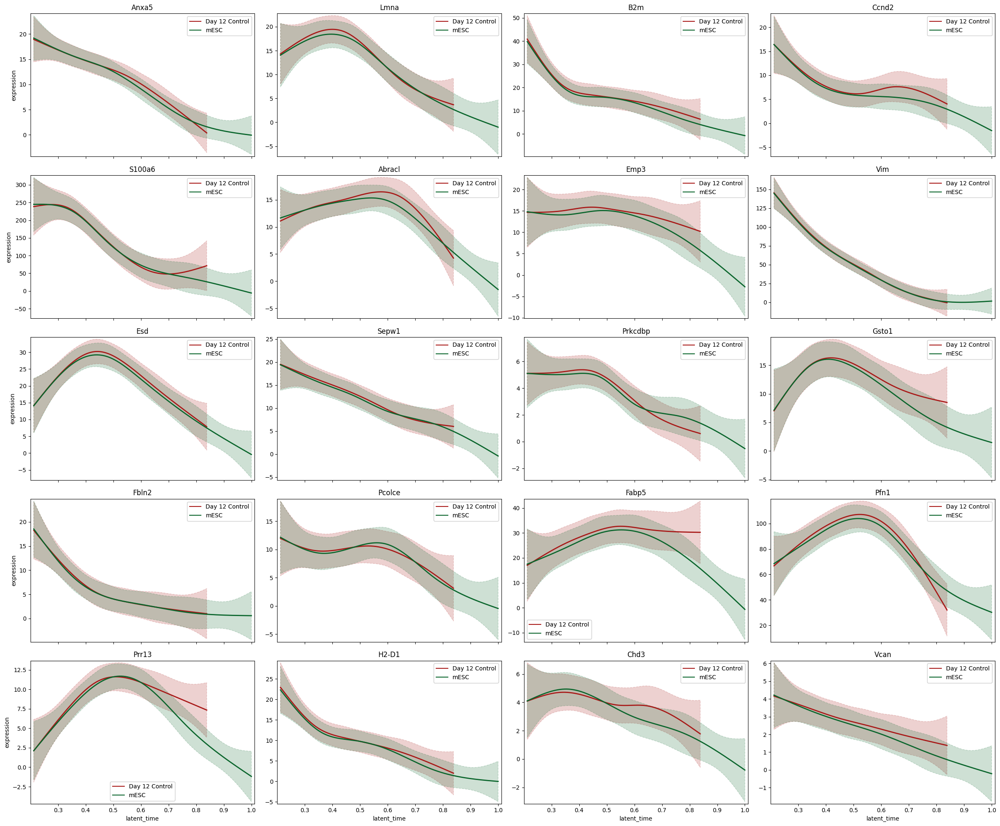

In [66]:
# Visualize control drivers

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

dead_end = "Day 12 Control"
cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(20).index,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

  0%|          | 0/20 [00:00<?, ?gene/s]

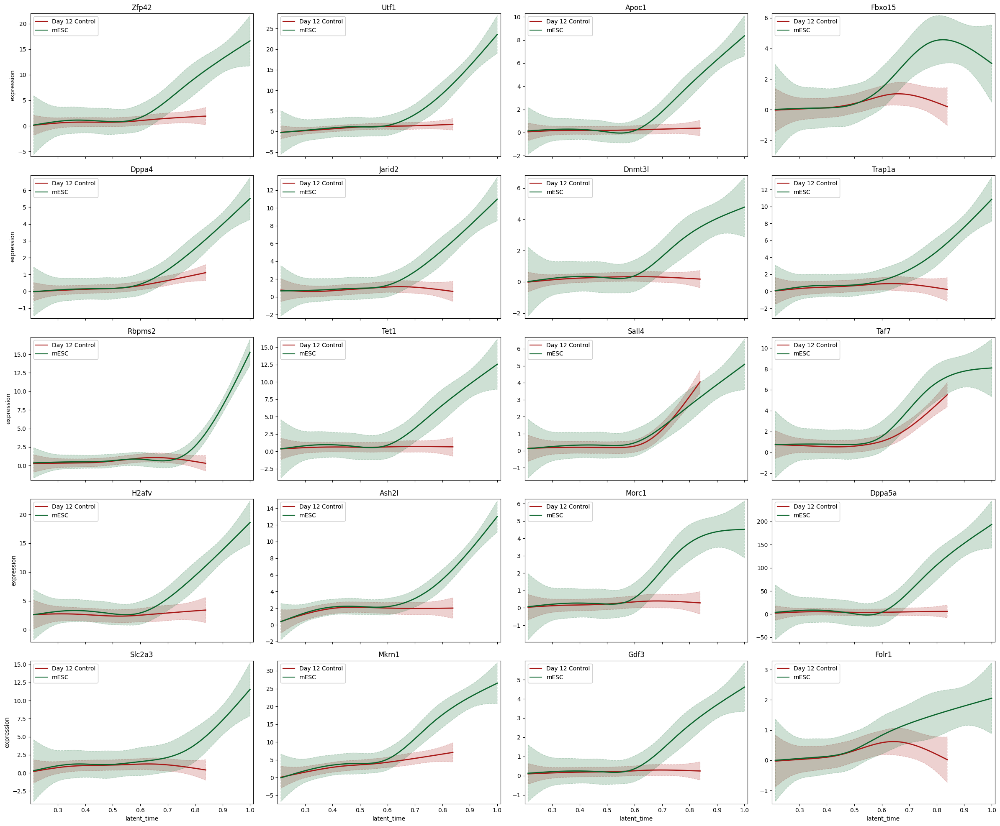

In [73]:
# Visualize reprogramming drivers

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=True).head(20).index,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

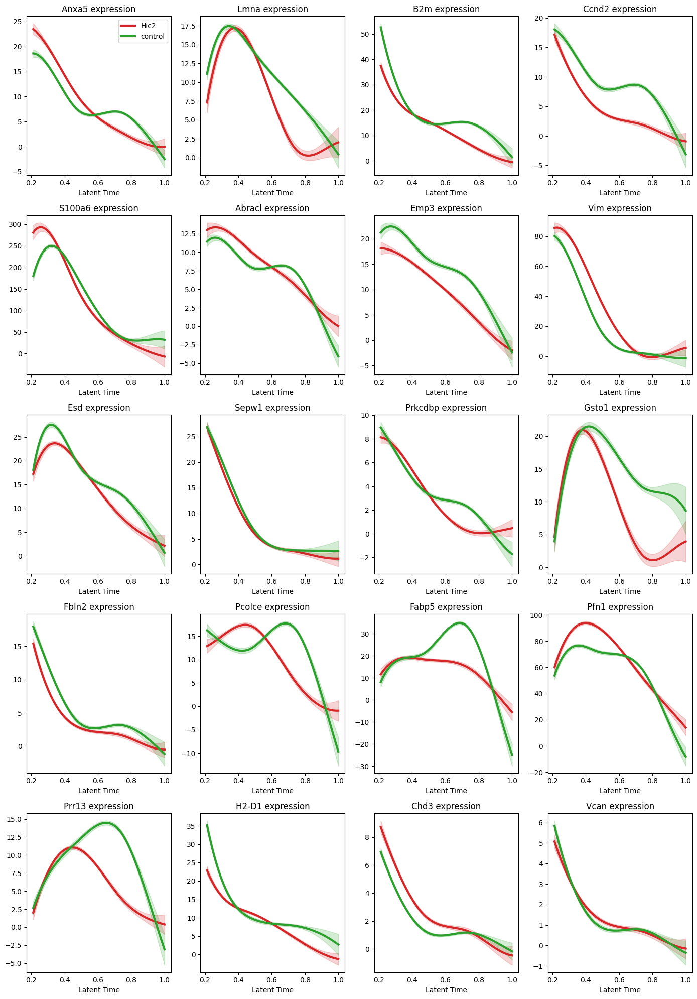

In [ ]:
# Trends independent of trajectory

control_driver_genes = driver_df.sort_values(f"Day 12 Control_corr", ascending=False).head(20).index

plot_grouped_gene_trend(
    adata, 
    control_driver_genes, 
    group_key="group", 
    layer="spliced", 
    groups=["Hic2", "control"]
)

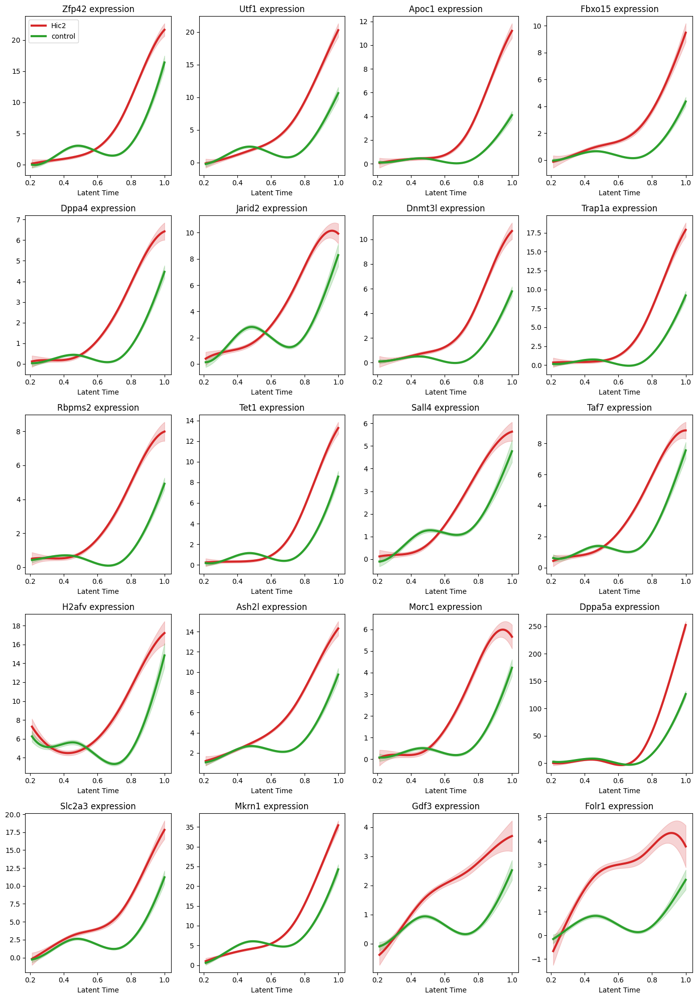

In [79]:
# Reprogramming drivers

reprogramming_driver_genes = driver_df.sort_values(f"mESC_corr", ascending=False).head(20).index

plot_grouped_gene_trend(
    adata, 
    reprogramming_driver_genes,
    group_key="group", 
    layer="spliced", 
    groups=["Hic2", "control"]
)

### Applying Hic2 drivers to control

  0%|          | 0/20 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


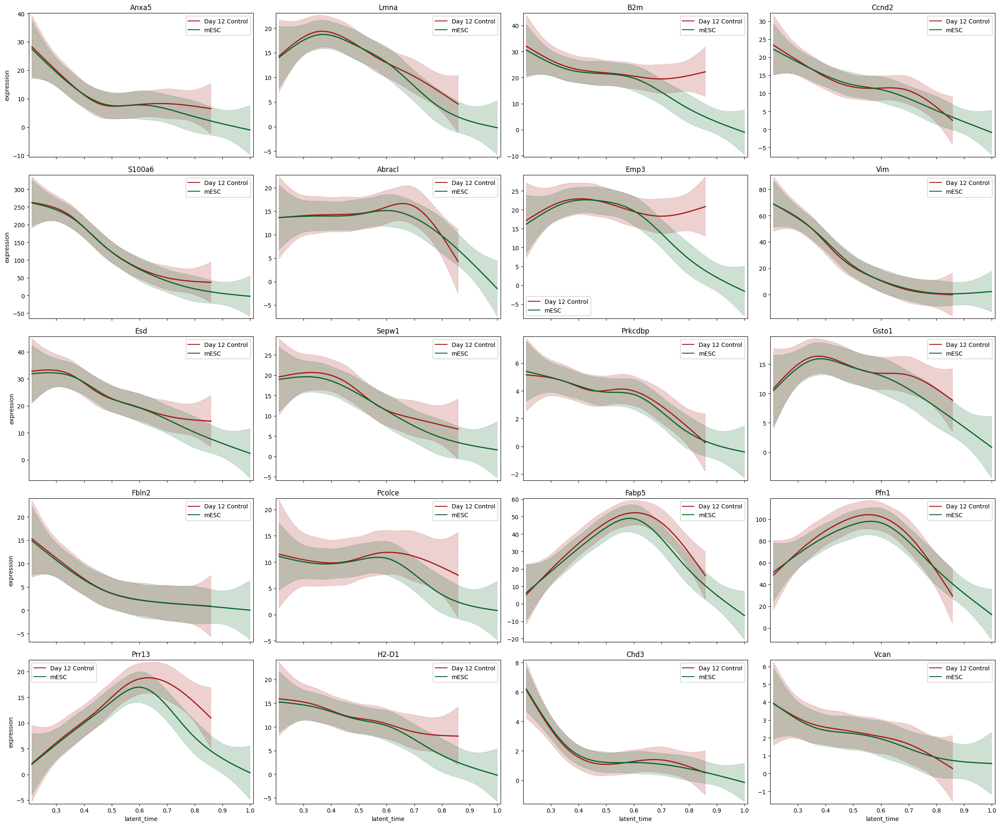

In [125]:
# Visualize control drivers

model = cellrank.models.GAMR(adata[control_indices], n_knots=6, smoothing_penalty=10.0)

dead_end = "Day 12 Control"
cellrank.pl.gene_trends(
    adata[control_indices],
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(20).index,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

  0%|          | 0/20 [00:00<?, ?gene/s]

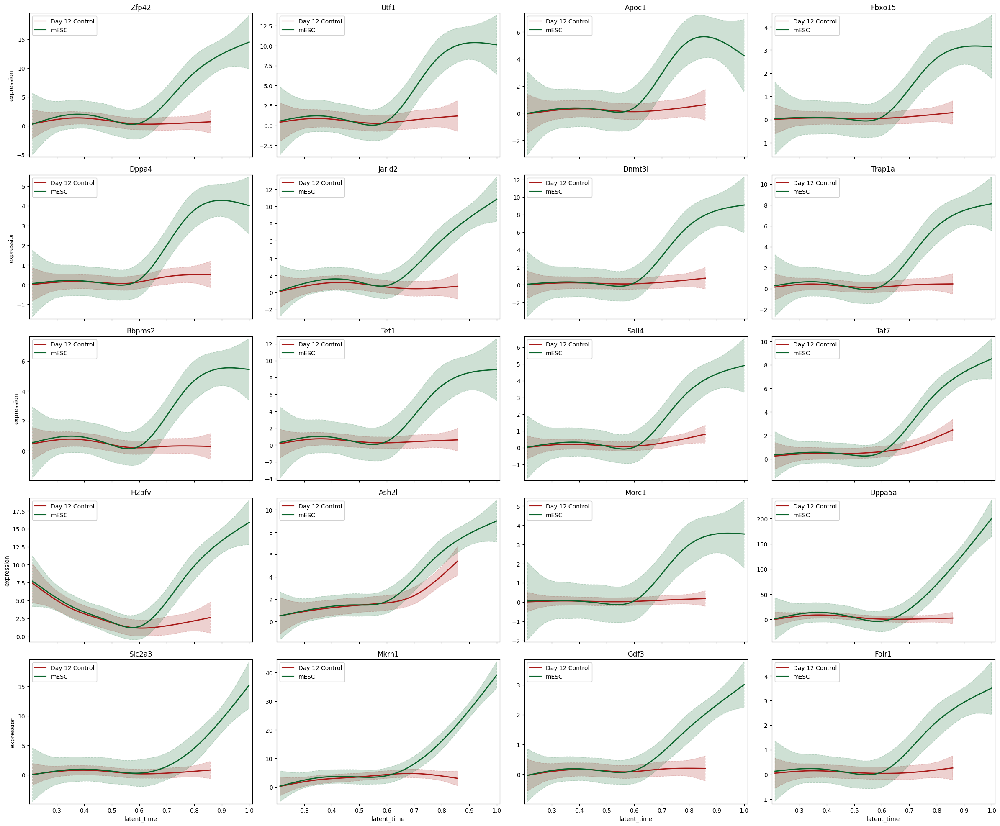

In [126]:
# Visualize mESC drivers

model = cellrank.models.GAMR(adata[control_indices], n_knots=6, smoothing_penalty=10.0)

dead_end = "Day 12 Control"
cellrank.pl.gene_trends(
    adata[control_indices],
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=True).head(20).index,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

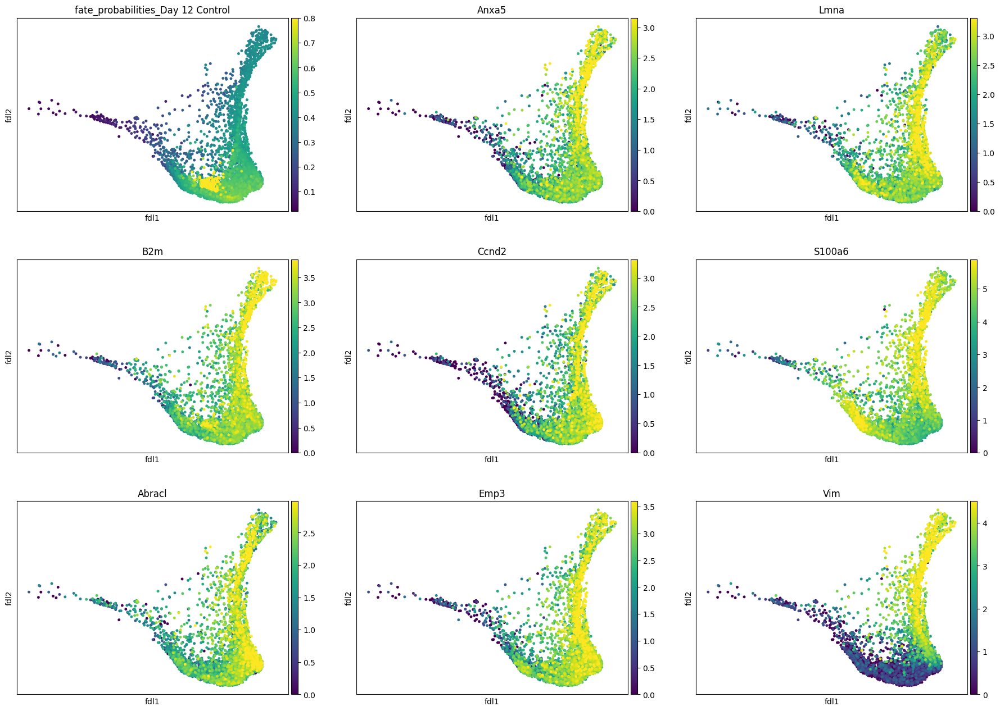

In [127]:
# Visualize driver genes for day 12 control

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata[control_indices],
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + list(driver_df.sort_values(f"{terminal_state}_corr", ascending=False).index[:8]),
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)

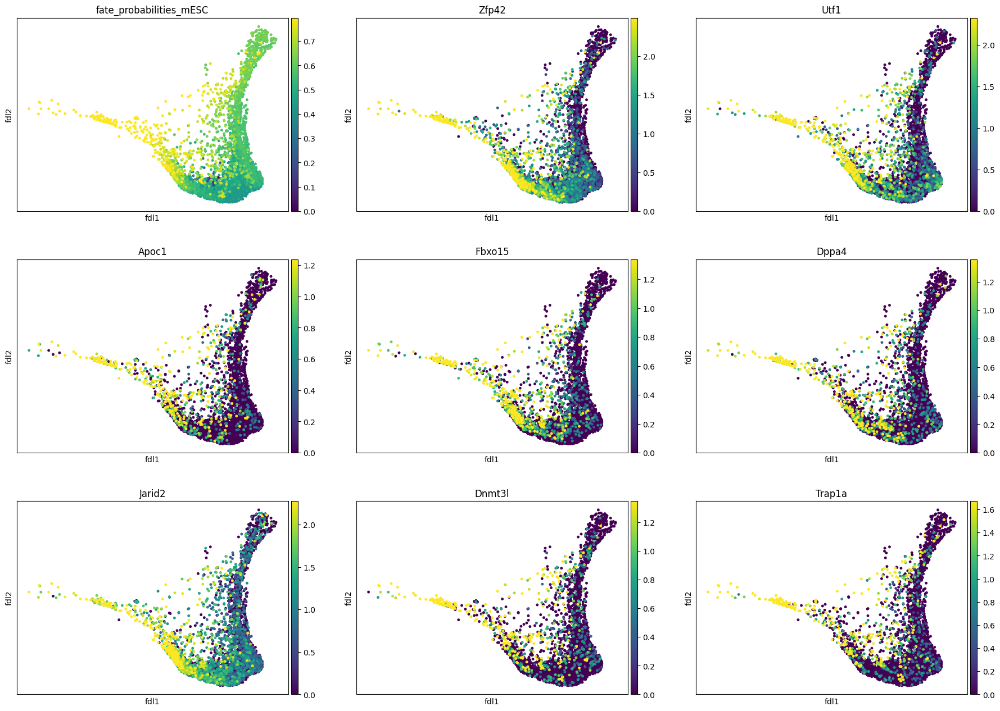

In [128]:
# Visualize driver genes for mESC

terminal_state = "mESC"
scanpy.pl.embedding(
    adata[control_indices],
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + list(driver_df.sort_values(f"{terminal_state}_corr", ascending=False).index[:8]),
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)